
# K-Means Clustering with Mall Customer Dataset

This notebook is designed to guide you step by step through implementing a K-Means clustering algorithm to analyze the Mall Customer Dataset. Follow the steps provided in each section to complete the project.


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import silhouette_score, davies_bouldin_score
import seaborn as sns




## Step 1: Data Preprocessing

- Drop any irrelevant columns if necessary (e.g., customer ID) andhHandle missing data (if any).
- Use visualizations (e.g., histograms or pair plots) to understand the distribution of the data.
- Perform Normalization and label encoder on relevant features to prepare them for clustering.


#### Load data

In [3]:
path = "customer_shopping_data.csv"
data = pd.read_csv(path)

In [4]:
data.head()

,invoice_no,customer_id,gender,age,category,quantity,price,payment_method,invoice_date,shopping_mall
0,I138884,C241288,Female,28,Clothing,5,1500.40,Credit Card,5/8/2022,Kanyon
1,I317333,C111565,Male,21,Shoes,3,1800.51,Debit Card,12/12/2021,Forum Istanbul
2,I127801,C266599,Male,20,Clothing,1,300.08,Cash,9/11/2021,Metrocity
3,I173702,C988172,Female,66,Shoes,5,3000.85,Credit Card,16/05/2021,Metropol AVM
4,I337046,C189076,Female,53,Books,4,60.60,Cash,24/10/2021,Kanyon


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99457 entries, 0 to 99456
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   invoice_no      99457 non-null  object 
 1   customer_id     99457 non-null  object 
 2   gender          99457 non-null  object 
 3   age             99457 non-null  int64  
 4   category        99457 non-null  object 
 5   quantity        99457 non-null  int64  
 6   price           99457 non-null  float64
 7   payment_method  99457 non-null  object 
 8   invoice_date    99457 non-null  object 
 9   shopping_mall   99457 non-null  object 
dtypes: float64(1), int64(2), object(7)
memory usage: 7.6+ MB


### Drop columns and missing data

In [365]:
data.drop(columns=["invoice_no","customer_id"], inplace=True)

In [366]:
print("Number of null values :", data.isna().sum().sum())

Number of null values : 0


### Visualisation of the data set

In [6]:
plot_gender = data.groupby(by=["gender"]).count().reset_index()
plot_gender

,gender,invoice_no,customer_id,age,category,quantity,price,payment_method,invoice_date,shopping_mall
0,Female,59482,59482,59482,59482,59482,59482,59482,59482,59482
1,Male,39975,39975,39975,39975,39975,39975,39975,39975,39975


In [368]:
plot_category = data.groupby(by=["category"]).count().reset_index()
plot_category.age *= (100 / plot_category.age.sum())
plot_category.head()

,category,gender,age,quantity,price,payment_method,invoice_date,shopping_mall
0,Books,4981,5.008194,4981,4981,4981,4981,4981
1,Clothing,34487,34.675287,34487,34487,34487,34487,34487
2,Cosmetics,15097,15.179424,15097,15097,15097,15097,15097
3,Food & Beverage,14776,14.856672,14776,14776,14776,14776,14776
4,Shoes,10034,10.088782,10034,10034,10034,10034,10034


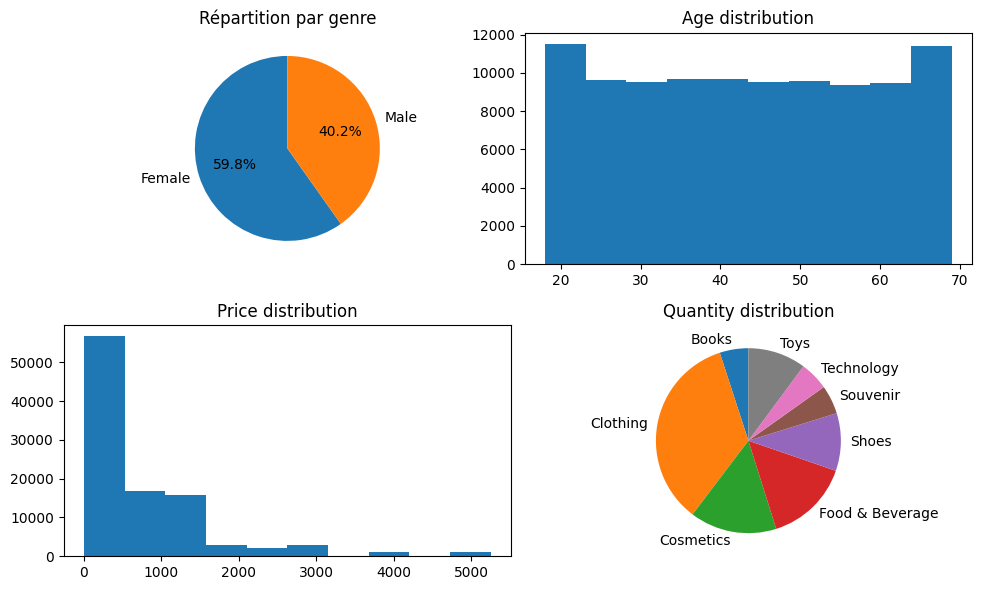

In [370]:
# plt.style.use('dark_background')
plt.rcdefaults()

plot_gender = data.groupby(by=["gender"]).count().reset_index()
plot_gender.age *= (100 / plot_gender.age.sum()) 

plot_category = data.groupby(by=["category"]).count().reset_index()
plot_category.age *= (100 / plot_category.age.sum())

fig, axs = plt.subplots(2, 2, figsize=(10,6))

axs[0,0].pie(
    plot_gender.age,  
    labels=plot_gender.gender, 
    autopct='%1.1f%%',  
    startangle=90)
axs[0,0].set_title("Répartition par genre")

axs[0,1].hist(data.age)
axs[0,1].set_title("Age distribution")

axs[1,0].hist(data.price)
axs[1,0].set_title("Price distribution")

axs[1,1].pie(
    plot_category.age,  
    labels=plot_category.category, 
    startangle=90,
    )
axs[1,1].set_title("Quantity distribution")

plt.tight_layout()
plt.show()

### Normalization and OneHotEncoding

In [371]:
df = data.copy()

#### Handle the dates

In [372]:
df.invoice_date = pd.to_datetime(df.invoice_date, format="%d/%m/%Y")

# Create new colums
df["month"] =         df.invoice_date.dt.month
df["week"] =          df.invoice_date.dt.isocalendar().week
df["month_day"] =     df.invoice_date.dt.day
df["week_day"] =      df.invoice_date.dt.weekday

df.drop(columns=["invoice_date"], inplace=True)

#### Normalisation 

In [373]:

# scaler = StandardScaler()
# data[["age", "price", "quantity"]] = scaler.fit_transform(data[["age", "price", "quantity"]])
# data

#### One hot encoding / label encoding

In [374]:
# # One Hot Encoding
# cat_columns = data.select_dtypes(include=["object"]).columns
# encoded = pd.get_dummies(data[cat_columns])*1
# df = pd.concat([data.drop(columns=cat_columns), encoded], axis=1)

In [375]:
# Label encoding

categorical_columns = ['gender', 'category', 'payment_method', 'shopping_mall']

label_encoders = {} # We keep the encoders for reverse encoding later

label_encoder = LabelEncoder()
for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])

    label_encoders[col] = le




## Step 2: Determine the Optimal Number of Clusters

1. Use the **Elbow Method** to find the best number of clusters (`k`):
   - Calculate the within-cluster sum of squares (WCSS) for different values of `k`.
   - Plot the WCSS against `k` to identify the "elbow point."
2. Optionally, use the **Silhouette Score** for further validation.


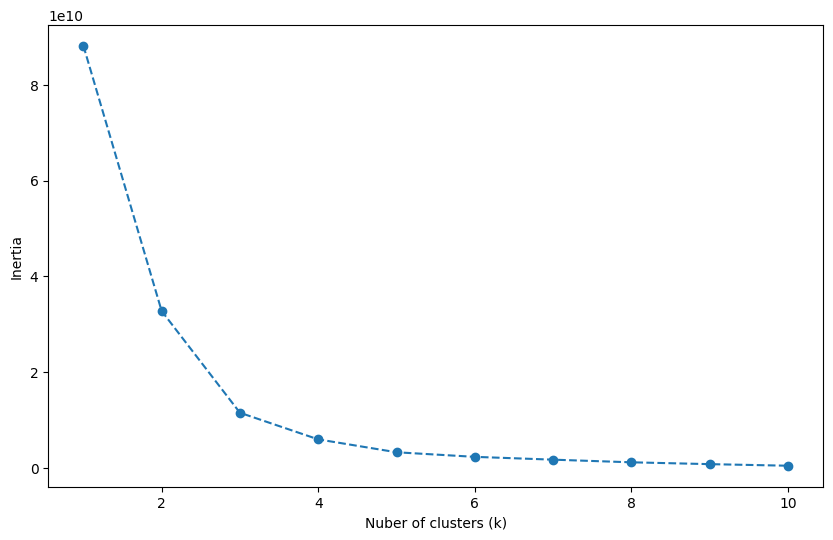

In [376]:
from sklearn.cluster import KMeans

inertias = []
for k in range(1,11):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df)
    inertias.append(kmeans.inertia_)


plt.figure(figsize=(10,6))
plt.plot(range(1,11), inertias, marker='o', linestyle="--")
plt.xlabel('Nuber of clusters (k)')
plt.ylabel('Inertia')
plt.show()

From now we chose k = 3

In [377]:
K = 3


## Step 3: Implement K-Means++ Clustering

- Use `sklearn.cluster.KMeans` to create and fit the K-Means model.
- Add the cluster labels as a new column to the dataset.


In [378]:
model = KMeans(n_clusters=K, init='k-means++',n_init=10, random_state=42)
model.fit(df)

KMeans(n_clusters=3, n_init=10, random_state=42)

In [379]:
data["cluster"] = model.predict(df)
df["cluster"]   = model.predict(df)

df.head()

,gender,age,category,quantity,price,payment_method,shopping_mall,month,week,month_day,week_day,cluster
0,0,28,1,5,1500.40,1,4,8,31,5,4,1
1,1,21,4,3,1800.51,2,2,12,49,12,6,1
2,1,20,1,1,300.08,0,6,11,45,9,1,0
3,0,66,4,5,3000.85,1,7,5,19,16,6,2
4,0,53,0,4,60.60,0,4,10,42,24,6,0


## Step 4: Performances

 ***Metrics :***
- **Silhouette score** : 

| Silhouette Score Value   | Interpretation                                                                 |
|--------------------------|-------------------------------------------------------------------------------|
| **> 0.7**                   | Very strong clustering: clusters are well-formed and clearly separated.      |
| **0.5 - 0.7**                | Acceptable clustering: clusters are well-defined but may have some overlaps. |
| **0.25 - 0.5**               | Moderate clustering: clusters are present but may not be clearly distinct.   |
| **< 0.25**                   | Weak clustering: poor cluster separation; the model may not be appropriate.  |

- **Davies-Bouldin Index (DB)** : 
<br>Measures the **quality** of clusters by assessing their **compactness** (how close points are within a cluster) and **separation** (how far clusters are from each other).
<br> Good for **comparing** different clustering **models** or the optimal **number of clusters**.

| **DB Score**       | **Interpretation**                                                               |
|---------------------|----------------------------------------------------------------------------------|
| **0 - 0.5**         | Excellent clustering: clusters are compact and well-separated.                  |
| **0.5 - 1.5**       | Good clustering: clusters are generally well-formed but may have slight overlap.|
| **1.5 - 2.5**       | Average clustering: noticeable overlap or less compact clusters.                |
| **> 2.5**           | Poor clustering: clusters are either poorly separated, overlapping, or ill-defined.|

#### Silhouette

In [ ]:
silouette = silhouette_score(df.drop(columns=["cluster"]), df.cluster )
print("Silhouette score :", round(silouette,3))

In [ ]:
# No normalisation and no sin date
silouette

0.7296988666161677

#### Davies-Bouldin Index (DB)

In [ ]:
db = davies_bouldin_score(df.drop(columns=["cluster"]), df.cluster)
print("Davies-Bouldin score :", round(db,3))

Davies-Bouldin score :  0.458


-----
## Step 5: Visualize the Clusters

- Use scatter plots to visualize the clusters in a 2D space.
   - Use relevant features from the dataset for the axes (e.g., Annual Income and Spending Score).
   - Use different colors for each cluster.
- Optionally, reduce the dimensionality of the data using PCA if you want to visualize it in 2D or 3D.


#### Plots

In [398]:
df

,gender,age,category,quantity,price,payment_method,shopping_mall,month,week,month_day,week_day,cluster
0,0,28,1,5,1500.40,1,4,8,31,5,4,1
1,1,21,4,3,1800.51,2,2,12,49,12,6,1
2,1,20,1,1,300.08,0,6,11,45,9,1,0
3,0,66,4,5,3000.85,1,7,5,19,16,6,2
4,0,53,0,4,60.60,0,4,10,42,24,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...
99452,0,45,5,5,58.65,1,4,9,38,21,2,0
99453,1,27,3,2,10.46,0,2,9,38,22,2,0
99454,1,63,3,2,10.46,2,6,3,12,28,6,0
99455,1,56,6,4,4200.00,0,3,3,11,16,1,2


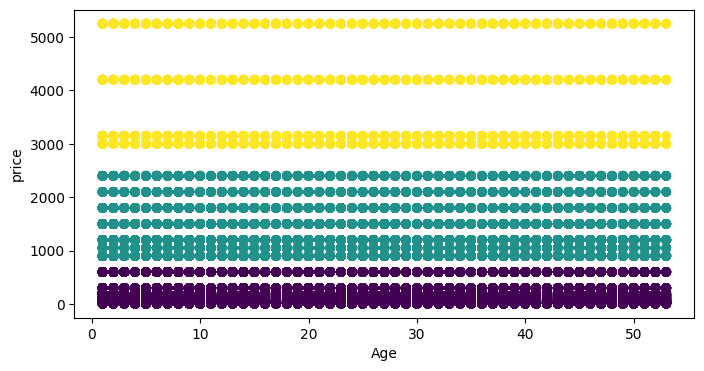

In [ ]:
plt.figure(figsize=(8,4))
plt.scatter( df["week"], df["price"], c = df["cluster"])
plt.xlabel("Age")
plt.ylabel("price")
plt.show()

<Axes: xlabel='category', ylabel='count'>

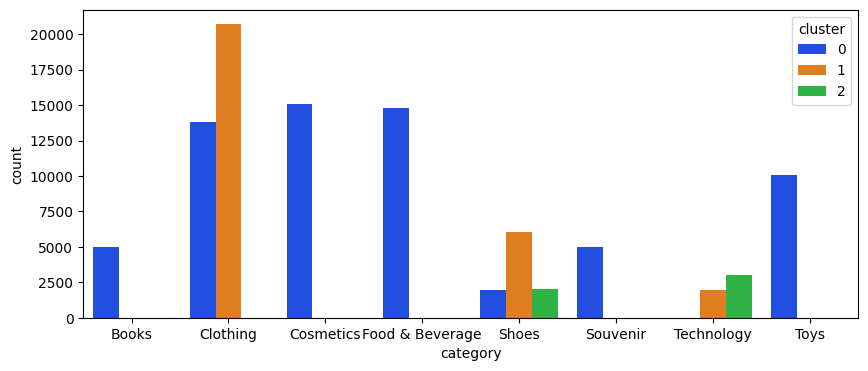

In [389]:
df_category_cluster = data.groupby(by=["category","cluster"])["category"].value_counts().reset_index()

plt.figure(figsize=(10, 4))
sns.barplot(data = df_category_cluster, x="category", y ="count", hue="cluster", palette="bright")

In [ ]:
import plotly.express as px
# plt.figure(figsize = (10,6))



fig = px.bar(
    df_category_cluster,
    x = "category",
    y="count",
    color="cluster",
    barmode="group",
    labels={"category": "Catégorie", "count": "Nombre"}
)

fig.update_layout(
    xaxis_title="Catégorie",
    yaxis_title="Nombre",
    legend_title="Cluster",
    template="plotly_white"
)

fig.show()


In [264]:
df.head()

,gender,age,category,quantity,price,payment_method,shopping_mall,month,week,month_day,week_day,cluster
0,0,28,1,5,1500.40,1,4,8,31,5,4,1
1,1,21,4,3,1800.51,2,2,12,49,12,6,1
2,1,20,1,1,300.08,0,6,11,45,9,1,0
3,0,66,4,5,3000.85,1,7,5,19,16,6,2
4,0,53,0,4,60.60,0,4,10,42,24,6,0


-----

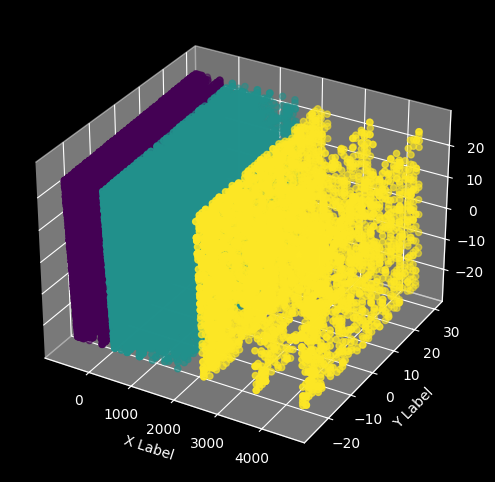

In [29]:
# PCA 
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
pca = PCA(n_components=3, random_state=42)
pca_res =pca.fit_transform(df.drop(columns=["cluster"]))

fig = plt.figure(figsize=(15,6))

ax = fig.add_subplot(111, projection='3d')

ax.scatter(pca_res[:, 0], pca_res[:, 1], pca_res[:, 2], c=df.cluster)

# Ajouter des labels pour les axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

plt.show()

In [30]:
import plotly.express as px
from sklearn.decomposition import PCA
import pandas as pd

# Supposons que df soit ton DataFrame avec les données
# Effectuer PCA sur les données (ici on suppose que df contient uniquement des colonnes numériques)
pca = PCA(n_components=3, random_state=42)
pca_res = pca.fit_transform(df)

# Convertir le résultat PCA en DataFrame pour plus de facilité
pca_df = pd.DataFrame(pca_res, columns=['PC1', 'PC2', 'PC3'])

# Ajouter une colonne de cluster si nécessaire, par exemple:
# pca_df['cluster'] = df['cluster']  # Si df a une colonne 'cluster'

# Créer un graphique 3D avec Plotly
fig = px.scatter_3d(
    pca_df, 
    x='PC1', y='PC2', z='PC3', 
    color=df['cluster'] if 'cluster' in df.columns else None,  # Colorier selon les clusters s'ils existent
    title='PCA - Graphique 3D',
    labels={'PC1': 'Composante principale 1', 'PC2': 'Composante principale 2', 'PC3': 'Composante principale 3'}
)

# Afficher le graphique
fig.show()



## Step 6: Evaluate the Clustering

- Evaluate the model using metrics like the Silhouette Score.



## Step 7: Cluster profiling

Identify the common characteristics of each cluster :
- **Dimensionality reduction** (PCA) for easier visualisaition
- Compute **means**, **medians**, or **distributions** of variables for each cluster (histogram, Heatmap, barplot, boxplots and scatter plots)
- For **categorical** variables : 
<br> **Mean** over columns to show proportion of this cluster that have a particular category and copare it with other cluster (heatmap)
<br> **Relative frequencies** : for a given cluster, show the freqency of each category of the variable (stacked bar plo)
<br> 



## Step 8: Extend the Analysis (Optional)

1. Experiment with different values of `k` and compare the results.
2. Try using other clustering algorithms like DBSCAN or Hierarchical Clustering.
3. Apply the same workflow to a different dataset to expand your skills.
